Populating the interactive namespace from numpy and matplotlib


C:\Users\Edi\Anaconda\lib\site-packages\IPython\core\magics\pylab.py:160: UserWarning: pylab import has clobbered these variables: ['figure', 'multiply', 'test', 'show']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"



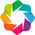

Error: Value 'svg' for key 'fig' not one of ['html', 'json', 'auto', 'png']
For help with the %output magic, call %output?



In [874]:
%pylab inline
import pandas as pd
import holoviews as hv
import geoviews as gv
hv.extension('bokeh','matplotlib')
from bokeh.models import HoverTool, ColumnDataSource
%output dpi=120 fig='svg'
import geopandas as gpd
pd.options.display.max_rows = 5000
from bokeh.plotting import figure, show, output_file
import json

In [3]:
import geoviews.feature as gf
import cartopy
import cartopy.feature as cf
import cartopy
from cartopy import crs 

In [4]:
bplaces=['Bălan', 'Baraolt', 'Miercurea Ciuc', 'Gheorgheni', 'Cristuru Secuiesc', 'Târgu Secuiesc',
       'Cluj-Napoca', 'Covasna', 'Praid', 'Reghin', 'Sighisoara', 'Sfântu Gheorghe',
       'Sovata', 'Toplița, Harghita', 'Odorheiu Secuiesc', 'Târgu Mureș', 'Vlahița']
bplacesxy=[(46.6525952, 25.8113436),
 (46.0751919, 25.5996242),
 (46.3614042, 25.8026675),
 (46.721277, 25.594165223362),
 (46.2889771, 25.0355987),
 (45.9996575, 26.1385903711511),
 (46.7693367, 23.5900604),
 (45.89930735, 25.9634201916174),
 (46.5529119, 25.1245222),####
 (46.7796886, 24.7000238),
 (46.2176969, 24.7937765),
 (45.8617282, 25.7893959),
 (46.5971683, 25.07328),####
 (46.9481269, 25.3752076671257),
 (46.3047462, 25.2950261),
 (46.5446244, 24.5611947),
 (46.3445399, 25.5298049)]

In [5]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world.head()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,28400000.0,Asia,Afghanistan,AFG,22270.0,"POLYGON ((61.21081709172574 35.65007233330923,..."
1,12799293.0,Africa,Angola,AGO,110300.0,(POLYGON ((16.32652835456705 -5.87747039146621...
2,3639453.0,Europe,Albania,ALB,21810.0,"POLYGON ((20.59024743010491 41.85540416113361,..."
3,4798491.0,Asia,United Arab Emirates,ARE,184300.0,"POLYGON ((51.57951867046327 24.24549713795111,..."
4,40913584.0,South America,Argentina,ARG,573900.0,(POLYGON ((-65.50000000000003 -55.199999999999...


In [6]:
def logarithm(data):
    return log(data)

Elso 500 szemely szuletesi hely es lakhely egyben, nem sorba rendezve

In [750]:
data = data=pd.DataFrame.from_dict(json.loads(open("second.json").read()))

In [751]:
world[world["name"]=="Romania"]["geometry"]

134    POLYGON ((22.71053144704049 47.88219391538941,...
Name: geometry, dtype: object

In [752]:
def Romania(place):
    %%output backend='bokeh'
    Romania=gv.Polygons(world[world["name"]=="Romania"]).options(cmap="magma_r",fill_alpha=0,toolbar='right')  
    return Romania
ro_dict = {name:Romania(name) for name in bplaces}
hmap_ro = hv.HoloMap(ro_dict, kdims='Birthplace')

In [753]:
def countries2(place):
    third_map=data[data["birth"]==place].groupby("NAME",as_index=False).count()
    third_map["log_nr"]=logarithm(third_map["id"])

    datam=world.merge(third_map[["NAME","id","log_nr"]],how="inner",left_on="name",right_on="NAME")
    
    p=gv.Polygons(datam, vdims=["log_nr","id","name"]).options(
        width=500,height=500,show_frame=True,xaxis=None,yaxis=None,
        cmap="magma_r",fill_alpha=1,toolbar='right')#merging with polygon table

    hover = HoverTool(
            tooltips=[
                ("Emberek száma", "@id"),# @-al mukodik
                ("Name", "@name"),
            ])
    hover.point_policy="follow_mouse"
    
    TOOLS= [hover]
    return p.opts(plot=dict(tools=[hover],projection=crs.Mollweide()))
map_dict = {name:countries2(name) for name in bplaces}
hmap = hv.HoloMap(map_dict, kdims='Birthplace')

In [114]:
data2 = pd.read_pickle('data2.pkl')

In [754]:
third_map=data[data["birth"]=="Sovata"].groupby("NAME",as_index=False).count()
third_map["log_nr"]=logarithm(third_map["id"])

datam=world.merge(third_map[["NAME","id","log_nr"]],how="inner",left_on="name",right_on="NAME")

In [755]:
datam

,pop_est,continent,name,iso_a3,gdp_md_est,geometry,NAME,id,log_nr
0,2.126264e+07,Oceania,Australia,AUS,800200.0,(POLYGON ((145.3979781434948 -40.7925485166058...,Australia,1,0.000000
1,8.210281e+06,Europe,Austria,AUT,329500.0,"POLYGON ((16.97966678230404 48.12349701597631,...",Austria,3,1.098612
2,1.560509e+08,Asia,Bangladesh,BGD,224000.0,"POLYGON ((92.67272098182556 22.04123891854125,...",Bangladesh,2,0.693147
3,1.987393e+08,South America,Brazil,BRA,1993000.0,POLYGON ((-57.62513342958296 -30.2162948544542...,Brazil,1,0.000000
4,3.348721e+07,North America,Canada,CAN,1300000.0,(POLYGON ((-63.66449999999998 46.5500099999999...,Canada,5,1.609438
5,1.338613e+09,Asia,China,CHN,7973000.0,(POLYGON ((110.3391878601516 18.67839508714761...,China,1,0.000000
6,8.232976e+07,Europe,Germany,DEU,2918000.0,"POLYGON ((9.921906365609232 54.98310415304803,...",Germany,17,2.833213
7,5.500510e+06,Europe,Denmark,DNK,203600.0,(POLYGON ((12.69000613775563 55.60999095318078...,Denmark,4,1.386294
8,4.052500e+07,Europe,Spain,ESP,1403000.0,POLYGON ((-9.034817674180246 41.88057058365968...,Spain,4,1.386294
9,6.405779e+07,Europe,France,FRA,2128000.0,(POLYGON ((-52.55642473001839 2.50470530843705...,France,6,1.791759


In [756]:
data[data["birth"]==place ][ data["NAME"]=="Romania"].groupby(["livesin","livesin_p_lon","livesin_p_lat"],).count().head()


C:\Users\Edi\Anaconda\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


,,,NAME,birth,birth_located,birth_p_lat,birth_p_lon,id,livesin_located,marriedsince,marriedto,name,...,other4,other5,other6,school,schoolyear,studwhat,studwhere,studyear,workwhat,workwhere
livesin,livesin_p_lon,livesin_p_lat,,,,,,,,,,,,,,,,,,,,,


In [757]:
def szekely_True(place):
    newmap=data[data["birth"]==place ][ data["NAME"]=="Romania"].groupby(["livesin","livesin_p_lon","livesin_p_lat"],as_index=False).count()
    p=hv.Points(np.array(newmap[["livesin_p_lon","livesin_p_lat","id","other6"]]),vdims=['size','z']).options(
        hover_alpha=0.7,fill_alpha=0.5,line_alpha=0,size_index=2,scaling_factor=10,sizing_mode='fixed',
        width=500,height=500,show_frame=True,xaxis=None,yaxis=None,
        cmap="magma_r")
    hover = HoverTool(
            tooltips=[
                ("Emberek száma", "@size"),# @-al mukodik
            ])
    hover.point_policy="follow_mouse"
    
    TOOLS= [hover]
    return p.opts(plot=dict(tools=[hover],norm=dict(framewise=True)))

def szekely_False(place):
    
    newmap=data[data["birth"]==place][ data["NAME"]=="Romania"].groupby(["livesin","livesin_p_lon","livesin_p_lat"],as_index=False).count()

    p=hv.Points(np.array(newmap[["livesin_p_lon","livesin_p_lat","id","other6"]]),vdims=['size','z']).options(
        hover_alpha=0.7,fill_alpha=0.5,line_alpha=0,size_index=2,scaling_factor=10,sizing_mode='fixed',
        width=500,height=500,show_frame=True,#xaxis=None,yaxis=None,
        cmap="magma_r")
    hover = HoverTool(
            tooltips=[
                ("Emberek száma", "@size"),# @-al mukodik
            ])
    hover.point_policy="follow_mouse"
    
    TOOLS= [hover]
    return p.opts(plot=dict(tools=[hover],norm=dict(framewise=True)))
birth_places_dict1 = {s:szekely_True(s) for s in bplaces}
birth_places_dict2 = {s:szekely_False(s) for s in bplaces}
holomap1 = hv.HoloMap(birth_places_dict1,kdims='Birthplace')
holomap2 = hv.HoloMap(birth_places_dict2,kdims='Birthplace')

C:\Users\Edi\Anaconda\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
C:\Users\Edi\Anaconda\lib\site-packages\ipykernel_launcher.py:18: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


In [758]:
print(holomap1)

:HoloMap   [Birthplace]
   :Points   [x,y]   (size,z)


In [759]:
print(hmap_ro)

:HoloMap   [Birthplace]
   :Polygons   [Longitude,Latitude]


In [760]:
print(hmap)

:HoloMap   [Birthplace]
   :Polygons   [Longitude,Latitude]   (log_nr,id,name)


In [761]:
hmap + (holomap1 * holomap2) #* gf.borders * gf.coastline

:Layout
   .HoloMap.I  :HoloMap   [Birthplace]
      :Polygons   [Longitude,Latitude]   (log_nr,id,name)
   .HoloMap.II :HoloMap   [Birthplace]
      :Overlay
         .Points.I  :Points   [x,y]   (size,z)
         .Points.II :Points   [x,y]   (size,z)

In [762]:
data[data["birth"]=="Sovata"][data["NAME"]=="Romania"].groupby(["livesin","livesin_p_lat","livesin_p_lon"],as_index=False).count()

C:\Users\Edi\Anaconda\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


,livesin,livesin_p_lat,livesin_p_lon,NAME,birth,birth_located,birth_p_lat,birth_p_lon,id,livesin_located,...,other4,other5,other6,school,schoolyear,studwhat,studwhere,studyear,workwhat,workwhere
0,"Arad, Arad",46.175379,21.319634,1,1,1,1,1,1,1,...,0,0,0,0,0,0,1,0,0,1
1,"Baia Mare, Maramures, Romania",47.656558,23.571984,2,2,2,2,2,2,2,...,0,0,0,0,0,0,2,1,0,2
2,"Baile Sovata, Mures, Romania",46.600141,25.085073,1,1,1,1,1,1,1,...,0,0,0,0,0,0,1,0,0,1
3,"Brassó, Brasov, Romania",45.652309,25.610275,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,1,1
4,"Bucharest, Romania",44.436141,26.102720,14,14,14,14,14,14,14,...,0,0,0,0,0,1,10,1,1,8
5,"Calimanesti, Mures, Romania",46.413325,24.732709,1,1,1,1,1,1,1,...,0,0,0,0,0,0,1,0,0,1
6,Cluj-Napoca,46.769337,23.590060,20,20,20,20,20,20,20,...,0,0,0,0,0,2,11,4,5,8
7,Comarnic,45.242777,25.634183,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
8,Csikszereda,46.361404,25.802667,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,1
9,Dej,47.142667,23.875988,1,1,1,1,1,1,1,...,0,0,0,0,0,0,1,0,0,1


In [763]:
def multiply(values):
    return values*2

In [764]:
def test(place):
    %%opts Overlay [width=500 height=500] 
    newmap=data[data["birth"]==place][data["NAME"]=="Romania"].groupby(["livesin_located","livesin_p_lat","livesin_p_lon"],as_index=False).count()
    p=gv.Points(newmap[["livesin_located","livesin_p_lat","livesin_p_lon","id"]]
                     , kdims=['livesin_p_lon', 'livesin_p_lat'],vdims=['id','livesin_located']).options(
        hover_alpha=0.7,fill_alpha=0.5,line_alpha=0.7,line_color='black',
        color_index=2,size_index=2,scaling_factor=10,sizing_mode='fixed',
        width=500,height=500,show_frame=True, xaxis=None,yaxis=None,toolbar='right',
        cmap="magma_r")
    hover = HoverTool(
            tooltips=[
                ("Emberek száma", "@id"),# @-al mukodik
                ("Varos","@livesin_located")
            ])
    hover.point_policy="follow_mouse"
    
    TOOLS= [hover]
    return p.opts(plot=dict(tools=[hover],norm=dict(framewise=True)))
test_dict = {s:test(s) for s in bplaces}
holomapt = hv.HoloMap(test_dict,kdims='Birthplace')

C:\Users\Edi\Anaconda\lib\site-packages\ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


In [765]:
def hist_test(place):
    return newmap=data[data["birth"]==place][data["NAME"]=="Romania"].groupby(["livesin_located","livesin_p_lat","livesin_p_lon"],as_index=False).count()s

SyntaxError: invalid syntax (<ipython-input-765-179c9135d8dd>, line 2)

In [766]:
layout = hv.Layout(hmap + holomapt * hmap_ro).cols(1)
layout

C:\Users\Edi\Anaconda\lib\site-packages\bokeh\core\json_encoder.py:80: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  elif np.issubdtype(type(obj), np.float):


:Layout
   .HoloMap.I  :HoloMap   [Birthplace]
      :Polygons   [Longitude,Latitude]   (log_nr,id,name)
   .HoloMap.II :HoloMap   [Birthplace]
      :Overlay
         .Points.I   :Points   [livesin_p_lon,livesin_p_lat]   (id,livesin_located)
         .Polygons.I :Polygons   [Longitude,Latitude]

In [152]:
all_data=data
size(all_data)

140000

In [153]:
all_data=pd.concat([all_data,data]).reset_index(drop=True)

In [154]:
size(all_data)

280000

In [876]:
def remove_uni(name):
    for s in unis2:
        if(s in name):
            name=name.replace(s," ")
    return name

In [877]:
isunis=[]
for name in data['studwhere']:
    isuni=False
    for s in unis:
        if(isinstance(name, str) and s in name):
            isuni=True
            break
    isunis.append(isuni)

In [878]:
unis=['university','egyetem','universitatea','universitate','facultatea']
unis2=['university','egyetem','universitatea','universitate','facultatea']

In [879]:
data["is_uni"]=isunis
data_unis=data[data["is_uni"]==True]

In [880]:
data_unis["studwhere"]=data_unis["studwhere"].apply(remove_uni)

C:\Users\Edi\Anaconda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [881]:
uni_names=[]
i=0
for s in data_unis["studwhere"]:
    #uni_names.append([])
    ok=False
    for words in ["babes","bolyai","babeș","ubb","iuliu hategan","iuliu hatiegan","iuliu hațieganu"]:
        if(words in s and ok==False):
            uni_names.append("Babeș-Bolyai")
            ok=True
    for words in ["petru maior"]:
        if(words in s and ok==False):
            uni_names.append("Petru Maior")
            ok=True
    for words in ["sapientia"]:
        if(words in s and ok==False):
            uni_names.append("Sapientia")
            ok=True  
    for words in ["transilvania",'transylvania ']:
        if(words in s and ok==False):
            uni_names.append("Transilvania, Brasov")
            ok=True
    for words in ["eotvos","eötvös"]:
        if(words in s and ok==False):
            uni_names.append("ELTE")
            ok=True
    for words in ["corvinus"]:
        if(words in s and ok==False):
            uni_names.append("Corvinus Budapest")
            ok=True
    for words in ["szeged"]:
        if(words in s and ok==False):
            uni_names.append("Szegedi")
            ok=True
    for words in ["umf"]:
        if(words in s and ok==False):
            uni_names.append("UMF")
            ok=True
    for words in ["semmelweis"]:
        if(words in s and ok==False):
            uni_names.append("SOTE")
            ok=True
    for words in ["alexandru ioan cuza","a i cuza"]:
        if(words in s and ok==False):
            uni_names.append("Alexandru Ioan Cuza Iasi")
            ok=True
    for words in ["partium"]:
        if(words in s and ok==False):
            uni_names.append("Partium")
            ok=True
    for words in ["din bucuresti","din bucurești"]:
        if(words in s and ok==False):
            uni_names.append("Din Bucuresti")
            ok=True
    for words in ["debrecen"]:
        if(words in s and ok==False):
            uni_names.append("Debrecen")
            ok=True
    ##############################################################################################################        
    for words1 in ["târgu","targu","tg","vasarhely","vásárhely","tirgu","tîrgu"]: 
        for words2 in ["mureș","mures","maros"]:
            for words3 in ["medicine","orvosi","medicina"]:
                if(words1 in s and words2 in s and words3 in s and ok==False):
                    uni_names.append("UMF")
                    ok=True
            for words3 in ["dimitrie cantemir"]:
                 if(words1 in s and words2 in s and words3 in s and ok==False):
                    uni_names.append("Dimitrie Cantemir Targu-Mures")
                    ok=True
            for words3 in ["muveszeti","művészeti","arte","arts","arta","art"]:
                 if(words1 in s and words2 in s and words3 in s and ok==False):
                    uni_names.append("Arts Targu-Mures")
                    ok=True
    ##############################################################################################################                
    for words1 in ["cluj-napoca","cluj napoca","kolozsvár","kolozsvar"]:                 
        for words2 in ["dimitrie cantemir"]:
            if(words1 in s and words2 in s and ok==False):
                    uni_names.append("Dimitrie Cantemir Cluj-Napoca")
                    ok=True
        for words2 in ["technical","tehnică",'tehnica']:
            if(words1 in s and words2 in s and ok==False):
                uni_names.append("Tehnical Cluj-Napoca")
                ok=True
        for words2 in ["muveszeti","művészeti","arte","arts","arta","art"]:
            if(words1 in s and words2 in s and ok==False):
                uni_names.append("Arts Cluj-Napoca")
                ok=True
        for words2 in ["arhitectura","architecture"]:
            if(words1 in s and words2 in s and ok==False):
                uni_names.append("Arhitectura Cluj-Napoca")
                ok=True  
        for words2 in ["usamv"]:
            if(words1 in s and words2 in s and ok==False):
                uni_names.append("USAMV Cluj-Napoca")
                ok=True
         
    ##############################################################################################################  
    for words1 in ["timisoara","timișoara"]: 
        for words2 in ["technical","tehnică",'tehnica',"műszaki","muszaki"]:
            if(words1 in s and words2 in s and ok==False):
                uni_names.append("Tehnical Timisoara")
                ok=True
    ##############################################################################################################
    for words1 in ["sibiu"]:
        for words2 in ["blaga"]: 
            for words3 in ["lucian"]:
                if(words1 in s and words2 in s and words3 in s and ok==False):
                    uni_names.append("Lucian Blaga Sibiu")
                    ok=True
    ##############################################################################################################
    for words1 in ["brasov","brașov","brasso","brassó"]:
        for words2 in ["dimitrie cantemir"]:
            if(words1 in s and words2 in s and ok==False):
                uni_names.append("Dimitrie Cantemir Brasov")
                ok=True
        for words2 in ["spiru haret"]:      
            if(words1 in s and words2 in s and ok==False):
                uni_names.append("Spiru Haret Sibiu")
                ok=True
    ##############################################################################################################
    for words1 in ["bucuresti","bucurești"]:            
        for words2 in ["spiru haret"]:
            if(words1 in s and words2 in s and ok==False):
                uni_names.append("Spiru Haret Bucuresti")
                ok=True
        for words2 in ["usamv"]:
            if(words1 in s and words2 in s and ok==False):
                uni_names.append("USAMV Bucuresti")
                ok=True
         
    ##############################################################################################################
    for words1 in ["budapest"]: 
        for words2 in ["technical","tehnică",'tehnica',"műszaki","muszaki"]:
            if(words1 in s and words2 in s and ok==False):
                uni_names.append("BME")
                ok=True
    if(ok==False): uni_names.append("None")
    #uni_names[i].append("None")
    i+=1

In [882]:
data_unis["uni_names"]=uni_names

C:\Users\Edi\Anaconda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [885]:
data_unis

,NAME,birth,birth_located,birth_p_lat,birth_p_lon,id,livesin,livesin_located,livesin_p_lat,livesin_p_lon,...,other6,school,schoolyear,studwhat,studwhere,studyear,workwhat,workwhere,is_uni,uni_names
1000,Romania,Reghin,"Reghin, Mureș, 545300, România",46.779689,24.700024,1000,Targu-Mures,"Târgu Mureș, Mureș, 540053, România",46.544624,24.561195,...,None,None,None,marketing & e-business,spiru haret bucuresti finante si banci,None,None,peeraj brands international,True,Spiru Haret Bucuresti
10005,Austria,Odorheiu Secuiesc,"Odorheiu Secuiesc, Harghita, 535600, România",46.304746,25.295026,10005,Fieberbrunn,"Fieberbrunn, Kitzbühel, Tirol, 6391, Österreich",47.476209,12.545462,...,None,None,None,communication and media science,babeș-bolyai,None,None,None,True,Babeș-Bolyai
10006,Romania,Sfântu Gheorghe,"Sfântu Gheorghe, Covasna, 520031, România",45.861728,25.789396,10006,"Marosvásárhely, Mures, Romania","Târgu Mureș, Mureș, 540053, România",46.544624,24.561195,...,None,None,None,dentistry faculty,of medicine and pharmacy of târgu mureș,None,None,None,True,UMF
10020,Romania,Cluj-Napoca,"Cluj-Napoca, Cluj, 400133, România",46.769337,23.590060,10020,Cluj-Napoca,"Cluj-Napoca, Cluj, 400133, România",46.769337,23.590060,...,None,None,None,"acting, directing","babes-bolyai cluj napoca,faculty of theater ...",None,"actor, actor",kolozsvári állami magyar színház,True,Babeș-Bolyai
10026,Italy,Sfântu Gheorghe,"Sfântu Gheorghe, Covasna, 520031, România",45.861728,25.789396,10026,None,"None, TO, PIE, Italia",44.933143,7.540121,...,None,None,None,psychology with criminology,de psihologie si sociologie bucuresti,11,former ovono,forró elek elemi iskola,True,None
10029,None,Cristuru Secuiesc,"Cristuru Secuiesc, Harghita, 535400, România",46.288977,25.035599,10029,"Oradea-Mare, Bihor, Romania",None,0.000000,0.000000,...,None,None,None,None,babeș-bolyai,09,"dancer, instructor, everybody",nagyvárad táncegyüttes,True,Babeș-Bolyai
1003,Romania,Târgu Secuiesc,"Târgu Secuiesc, Covasna, 525400, România",45.999657,26.138590,1003,"Kézdivásárhely, Covasna, Romania","Târgu Secuiesc, Covasna, 525400, România",45.998897,26.135312,...,None,None,None,None,"babes-bolyai tudomány , kolozsvár",02,None,petőfi sándor általános iskola csíkszereda,True,Babeș-Bolyai
10030,Romania,Miercurea Ciuc,"Miercurea Ciuc, Harghita, 530104, România",46.361404,25.802667,10030,Cluj-Napoca,"Cluj-Napoca, Cluj, 400133, România",46.769337,23.590060,...,None,None,None,None,babes-bolyai of cluj,None,None,None,True,Babeș-Bolyai
10033,Romania,Gheorgheni,"Gheorgheni, Harghita, România",46.721277,25.594165,10033,Gyergyószentmiklós,"Gheorgheni, Harghita, 535500, România",46.722612,25.602244,...,None,None,None,None,"spiru haret , finante banci",None,None,None,True,None
10034,Romania,Covasna,"Covasna, România",45.899307,25.963420,10034,"Kézdivásárhely, Covasna, Romania","Târgu Secuiesc, Covasna, 525400, România",45.998897,26.135312,...,None,None,None,None,babeș-bolyai,None,None,allianz global investors,True,Babeș-Bolyai


In [883]:
data_unis[data_unis["uni_names"]=='None'].groupby(by="studwhere",as_index=False).count().sort_values(by="id",ascending=False)

,studwhere,NAME,birth,birth_located,birth_p_lat,birth_p_lon,id,livesin,livesin_located,livesin_p_lat,...,other5,other6,school,schoolyear,studwhat,studyear,workwhat,workwhere,is_uni,uni_names
397,northeastern illinois,94,111,111,111,111,111,100,94,111,...,0,0,0,0,5,9,28,79,111,111
258,"spiru haret , finante banci",42,46,46,46,46,46,43,42,46,...,0,0,0,0,15,11,10,30,46,46
281,"academia de studii economice, de cibernetica...",26,26,26,26,26,26,25,26,26,...,0,0,0,0,6,8,4,13,26,26
127,de stiinte agricole si medicina veterinara d...,20,21,21,21,21,21,19,20,21,...,0,0,0,0,4,6,9,12,21,21
155,"dimitrie cantemir ,pedagogie",17,20,20,20,20,20,18,17,20,...,0,0,0,0,6,3,6,14,20,20
176,hyperion bucuresti,17,19,19,19,19,19,17,17,19,...,0,0,0,0,8,10,7,14,19,19
367,károli gáspár református tanítóképző főiskol...,17,17,17,17,17,17,14,17,17,...,0,0,0,0,5,7,7,11,17,17
286,ase bucuresti de cibernetica,17,17,17,17,17,17,17,17,17,...,0,0,0,0,4,8,7,11,17,17
145,de vest din timisoara- de drept,13,13,13,13,13,13,13,13,13,...,0,0,0,0,5,7,5,7,13,13
225,of oxford,12,13,13,13,13,13,12,12,13,...,0,0,0,0,3,3,3,8,13,13


In [884]:
data_unis.groupby(by="uni_names",as_index=False).count().sort_values(by="id",ascending=False)

,uni_names,NAME,birth,birth_located,birth_p_lat,birth_p_lon,id,livesin,livesin_located,livesin_p_lat,...,other5,other6,school,schoolyear,studwhat,studwhere,studyear,workwhat,workwhere,is_uni
5,Babeș-Bolyai,2096,2201,2201,2201,2201,2201,1842,2096,2201,...,0,0,0,0,598,2201,759,633,1360,2201
14,None,1092,1180,1180,1180,1180,1180,1037,1092,1180,...,0,0,0,0,271,1180,383,353,774,1180
25,UMF,403,422,422,422,422,422,353,403,422,...,0,0,0,0,83,422,142,78,176,422
24,"Transilvania, Brasov",373,396,396,396,396,396,343,373,396,...,0,0,0,0,108,396,138,112,234,396
16,Petru Maior,286,361,361,361,361,361,318,286,361,...,0,0,0,0,91,361,119,98,221,361
13,Lucian Blaga Sibiu,155,171,171,171,171,171,141,155,171,...,0,0,0,0,47,171,63,50,106,171
22,Tehnical Cluj-Napoca,160,163,163,163,163,163,139,160,163,...,0,0,0,0,46,163,58,43,85,163
18,Sapientia,144,158,158,158,158,158,127,144,158,...,0,0,0,0,33,158,75,42,105,158
10,Dimitrie Cantemir Targu-Mures,67,96,96,96,96,96,89,67,96,...,0,0,0,0,37,96,21,17,53,96
3,Arts Targu-Mures,69,70,70,70,70,70,48,69,70,...,0,0,0,0,18,70,21,24,53,70
